# Inferring Vector Magnetic Fields from Stokes Profiles of GST/NIRIS Using a Convolutional Neural Network

### Data
* **Stokes Inversion:** This is important and challengting task in solar physics its purpose is to infer physical paramters such as the total magnetic field strength, inclination and azimuth angles, Doppler shift of the line center.
    * **Magnetic Inclination:**  Angle of dip. It is the angle mae by the horizontal plane.
    * **Azimuth Angles:** is an angular measurment in a spherical coordinate system. The vector from an observer (origin) to a point of interest is projected perpendicularly onto a reference plane.
    * **Doppler Shift:** The Change of pitch becuase of movement
* **InfraRed Imaging Magnetograph (IRIM):** Has high resolution vector magnetograms of the solar atmosphere from the deppest photosphere through the base of the corona. This is the second generation of the InfraRed Imaging Magnetograph
    * Has a 85 arcsec FOV with a cadence of 1 sec for spectroscopic scan and 10 sec for full Stokes measurements.
    * Uses half the chip to capture 2 simultaneous polarization states side-by-side
    * provides an image scale of 0".083 /pixel.
    * Produces full spectroscopic measurements I, Q, U, V (Stokes profile) at resolution of 0.01 nm in Fe I 1564.8 nm.
* Each *Test Set* has 518,400 Pixels corresponding to 518,400 data samples
* *Training Set* are disjointed from test set first 
* Stokes profiles and labels have different units and scales, normalize them
    1. Stokes Profiles, divide by 1,000
    2. Labels dividing by 5,000
    3. azimuth angle dividing by pie
##### Active Regions
* **AR 12371** 
    * 10 990x950 images collected at 10 different time points on 2015 June 22, randomly select 1,000,000 pixels (data samples) from 10 images to form the training set.
    * 10 720x720 images collected at 10 different time points on 2015 June 25, use images collected at 10PM UT on 2015 of Fune 25 as the 1st Test Set
* **AR 12665**
    * 10 720x720 images from collected at 10 different time points on 2017 July 13 at 18:35 UT 2nd Test Set
* **AE 12673**
    * 1 720x720 image at 19:18 UT on 2017 September 7 and this will be 3rd Test Set

In [33]:
import tensorflow as tf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import time
import csv
import math

from keras.layers import *
from keras.models import *
from tensorflow.keras.optimizers import Adam

## Data Fetch
* Each data sample (Pixel) is comprised of Stokes I, Q, U, and V profiles taken at 60 spectral points.
* Each data sample has a label which is the vector magnetic field, which includes the total magnetic field strength, inclination angle and azimuth angle.

In [2]:
df = pd.read_csv('./Data/Training/Normalized/normalized_train.csv', header=None)
df_values = df.values
X_data = df_values[:, 3:]
y = df_values[:, :3]
X = X_data.reshape(X_data.shape[0], 60, 3)

## Model
* The model will perform pixel-by-pixel inversions, exploiting the spatial information of the Stokes profiles in a pixel also the NIRIS data each Stokes component has 60 spectral point.
* The model is to predict or infer the label of a test data sample from the Stokes Q, U, and V profiels this is calibrated by the Stokes I COmponent of the test data sample then compaire the labels.
* This can be considered as a physics-assisted deep learning-based method.
* The Model has an input layer, 3 convolutional blocks, 2 fully connected layers, and an output layer.

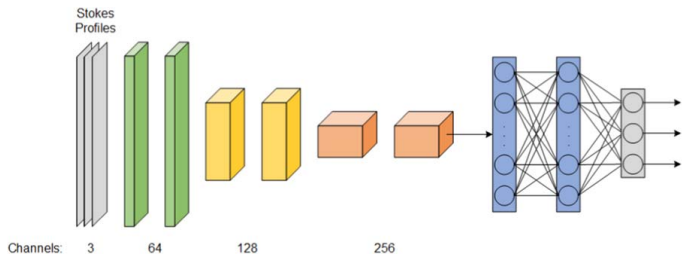

## Input Layer
* shape will consist of a shape of 60 due to the 60 wavelength with a channel of 3 to represent the Stokes Profiles of Q, U, V, each channel corresponds to a Stokes Component.

In [3]:
input = Input(shape=(60, 3))

## 3 Convolutional Blocks
* **Activation Function:** ReLU will be used in both the convolutional and Fully Connected Layers.

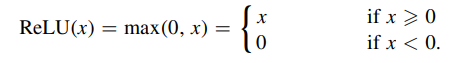

## Block 1
* 2 Convolutional Layers which take an input from the output of previous layer, these will have 64 neurons with size of 3x1x3 and 3x1x64
* Maxpooling layers with pooling of 2

In [4]:
b1_1 = Conv1D(filters=64, kernel_size=3, padding='same', activation='relu')(input)
b1_2 = Conv1D(filters=64, kernel_size=3, padding='same', activation='relu')(b1_1)
b1_pool = MaxPool1D(pool_size=2)(b1_2)

## Block 2
* 2 Convolutional Layers which take an input from the output of previous layer, these will have 128 neurons with size of 3x1x64 and 3x1x128
* Maxpooling layers with pooling of 2

In [5]:
b2_1 = Conv1D(filters=128, kernel_size=3, padding='same', activation='relu')(b1_pool)
b2_2 = Conv1D(filters=128, kernel_size=3, padding='same', activation='relu')(b2_1)
b2_pool = MaxPool1D(pool_size=2)(b1_2)

## Block 3
* 2 Convolutional Layers which take an input from the output of previous layer, these will have 256 neurons with size of 3x1x128 and 3x1x256

In [6]:
b3_1 = Conv1D(filters=256, kernel_size=3, padding='same', activation='relu')(b2_pool)
b3_2 = Conv1D(filters=256, kernel_size=3, padding='same', activation='relu')(b3_1)

## Output of CNN
* 3 Convolutional blocks must be flatten into a sequence, this is then sent to 2 fully connected layers.

In [7]:
cnn_out = Flatten()(b3_2)

## Dense Layer 1
* Neurons will have 1024 which will use a ReLU activation function with a Dropout Rate of 25%

In [8]:
d1 = Dense(1024, activation='relu')(cnn_out)
d1_drop = Dropout(0.25)(d1)

## Dense Layer 2
* Nerons will have 1024 which will use a ReLU activation function with a Dropout Rate of 25%

In [9]:
d2 = Dense(1024, activation='relu')(d1_drop)
d2_drop = Dropout(0.25)(d2)

## Output
* Dense layer with 3 neurons with an activation function of Tanh each neuron will lie in the range of (-1, 1) representing the total magnetic field strength, inclination angle, and azimuth angle.

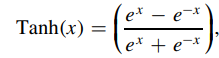

In [10]:
output = Dense(3, activation='tanh')(d2_drop)

In [11]:
model = Model(input, output)

In [12]:
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 60, 3)]           0         
_________________________________________________________________
conv1d (Conv1D)              (None, 60, 64)            640       
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 60, 64)            12352     
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 30, 64)            0         
_________________________________________________________________
conv1d_4 (Conv1D)            (None, 30, 256)           49408     
_________________________________________________________________
conv1d_5 (Conv1D)            (None, 30, 256)           196864    
_________________________________________________________________
flatten (Flatten)            (None, 7680)              0     

## Compile Model
* Using L1 Loss
    * N = 1,000,000 is the total number of pixels in the training set
    * tot total magnetic field strength
    * inc inclination angle
    * azi azimuth angle
    * each are assoicated with the ith pixel

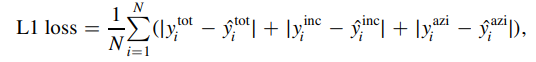

In [13]:
model.compile(loss='mean_absolute_error', optimizer=Adam(decay=0.01), metrics=['mae'])

In [14]:
model.fit(X, y, batch_size=512, epochs=50, shuffle=True, verbose=True)

Epoch 1/50
1954/1954 [==============================] - 48s 22ms/step - loss: 0.0423 - mae: 0.0423
Epoch 2/50
1954/1954 [==============================] - 43s 22ms/step - loss: 0.0347 - mae: 0.0347
Epoch 3/50
1954/1954 [==============================] - 44s 22ms/step - loss: 0.0333 - mae: 0.0333
Epoch 4/50
1954/1954 [==============================] - 44s 22ms/step - loss: 0.0326 - mae: 0.0326
Epoch 5/50
1954/1954 [==============================] - 47s 24ms/step - loss: 0.0322 - mae: 0.0322
Epoch 6/50
1954/1954 [==============================] - 46s 24ms/step - loss: 0.0318 - mae: 0.0318
Epoch 7/50
1954/1954 [==============================] - 47s 24ms/step - loss: 0.0316 - mae: 0.0316
Epoch 8/50
1954/1954 [==============================] - 47s 24ms/step - loss: 0.0314 - mae: 0.0314
Epoch 9/50
1954/1954 [==============================] - 47s 24ms/step - loss: 0.0312 - mae: 0.0312
Epoch 10/50
1954/1954 [==============================] - 47s 24ms/step - loss: 0.0310 - mae: 0.0310
Epoch 11/

## Testing
* After training the model we will run test data sample (Pixel) we can dervie the 3 Cartesian components of the magnetic field X, Y and Z of the pixel.
    * B Total denotes the total magnetic field strength
    * φ is the inclination angle
    * θ is the azimuth angle

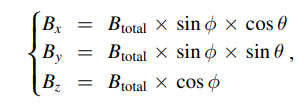

### Test Set 1

In [2]:
df = pd.read_csv('./Data/Testing/testset1/normalized_testset1.csv', header=None)
df_values = df.values
X_data = df_values
X = X_data.reshape(X_data.shape[0], 60, 3)

In [3]:
start = time.time()
y_predict = model.predict(X)
end = time.time()
print('Time:', np.round(end - start, 1), 's')

NameError: name 'model' is not defined

In [ ]:
result_file = './Results/testset_1/testset1.csv'
with open(result_file, 'w', encoding='UTF-8') as result_csv:
    w = csv.writer(result_csv)
    for i in range(len(y_predict)):
        tmp = list()
        tmp.append(y_predict[i][0])
        tmp.append(y_predict[i][1])
        tmp.append(y_predict[i][2])
        w.writerow(tmp)

In [4]:
test_one = './Results/testset_1/testset1.csv'
df = pd.read_csv(test_one, header=None)

In [5]:
df_value = df.values

* Due to Stokes PRofiles and labels having different units and scales, your would need to normalize them.
    * **Stokes Profiels Normalization:** Divide them by 1000, this is becuase the values are between -1000 and 1000
    * **Labels Normalization**
        1. Total Magnetic Field Strength: This is done by dividing it by 5000, this is becuase the range is between -5000 and 5000 G
        2. Inclination and Azimuth Angles: Divide them by Pi.

In [6]:
df_value[:, [0]] = df_value[:, [0]] * 5000.

In [7]:
df_value[:, [1, 2]] = df_value[:, [1,2]] * math.pi

In [8]:
predicted_bx = np.multiply(np.multiply(df_value[:, 0], np.sin(df_value[:, 1])), np.cos(df_value[:, 2]))

In [9]:
predicted_by = np.multiply(np.multiply(df_value[:, 0], np.sin(df_value[:, 1])), np.cos(df_value[:, 2]))

In [10]:
predicted_bz = np.multiply(df_value[:, 0], np.cos(df_value[:, 1]))

In [11]:
df_value[:, [1, 2]] = df_value[:, [1, 2]] / math.pi * 180.

* We need to reshape to display on the graph

In [12]:
predicted_btotal_img = df_value[:, 0].reshape(720, 720)

In [13]:
predicted_inclination_img = df_value[:, 1].reshape(720, 720)

In [14]:
predicted_azimuth_img = df_value[:, 2].reshape(720, 720)

In [15]:
predicted_bx_img = predicted_bx.reshape(720, 720)

In [16]:
predicted_by_img = predicted_by.reshape(720, 720)

In [17]:
predicted_bz_img = predicted_bz.reshape(720, 720)

In [18]:
ref_btotal_img = np.ones((720, 720)) * 4000
ref_btotal_img[0][0] = 0

In [19]:
ref_angle_img = np.ones((720, 720)) * 180
ref_angle_img[0][0] = -5

In [20]:
ref_bx_img = np.ones((720, 720)) * 3000
ref_bx_img[0][0] = -3500

In [21]:
ref_by_img = np.ones((720, 720)) * 3000
ref_by_img[0][0] = -3500

In [22]:
ref_bz_img = np.ones((720, 720)) * 3000
ref_bz_img[0][0] = -3500

In [37]:
fontsize = 20
titlesize = 24
my_map = 'RdBu'
img_width = 10
img_height = 10

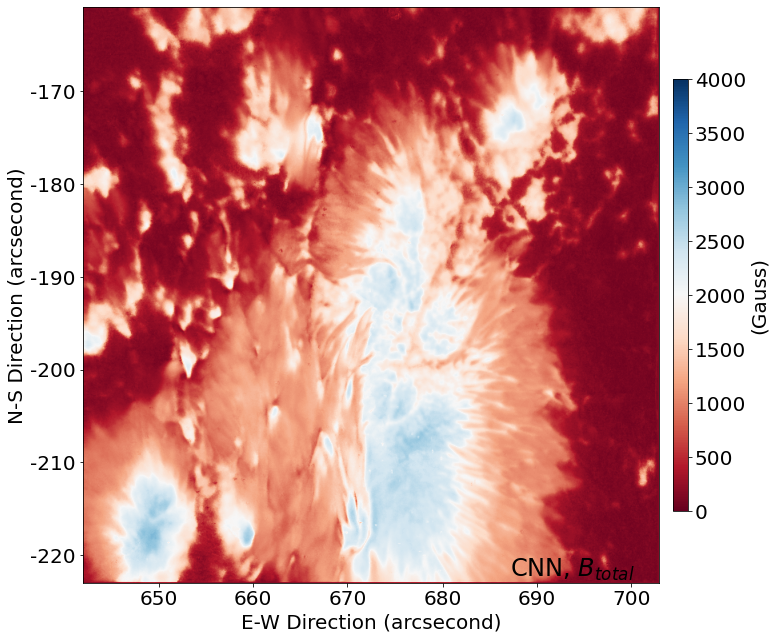

In [42]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(img_width, img_height))
norm = matplotlib.colors.Normalize(vmin=0, vmax=4000)
im = ax.imshow(ref_btotal_img, cmap=my_map, norm=norm)
ax.imshow(predicted_btotal_img, cmap=my_map, norm=norm)
ax.set_ylabel('N-S Direction (arcsecond)', fontsize=fontsize)
ax.set_xlabel('E-W Direction (arcsecond)', fontsize=fontsize)
ax.set_xticks([94, 212, 330, 449, 567, 685])
ax.set_xticklabels(['650', '660', '670', '680', '690', '700'], fontsize=fontsize)
ax.set_yticks([105, 221, 337, 453, 569, 685])
ax.set_yticklabels(['-170', '-180', '-190', '-200', '-210', '-220'], fontsize=fontsize)
ax.set_title('CNN, $B_{total}$', x=0.85, y=0, fontsize=titlesize)
fig.subplots_adjust(bottom=0.1, top=0.9, left=0.1, right=0.9, wspace=0.15, hspace=0.15)
cax = plt.axes([0.92, 0.2, 0.02, 0.6])  # bottom left width height
matplotlib.rcParams.update({'font.size': fontsize})
cb = fig.colorbar(im, cax=cax, norm=norm)
cb.ax.tick_params(labelsize=fontsize)
cb.set_label('(Gauss)', fontsize=fontsize)
plt.savefig('./results/testset_1/images/Btotal.png', bbox_inches='tight')

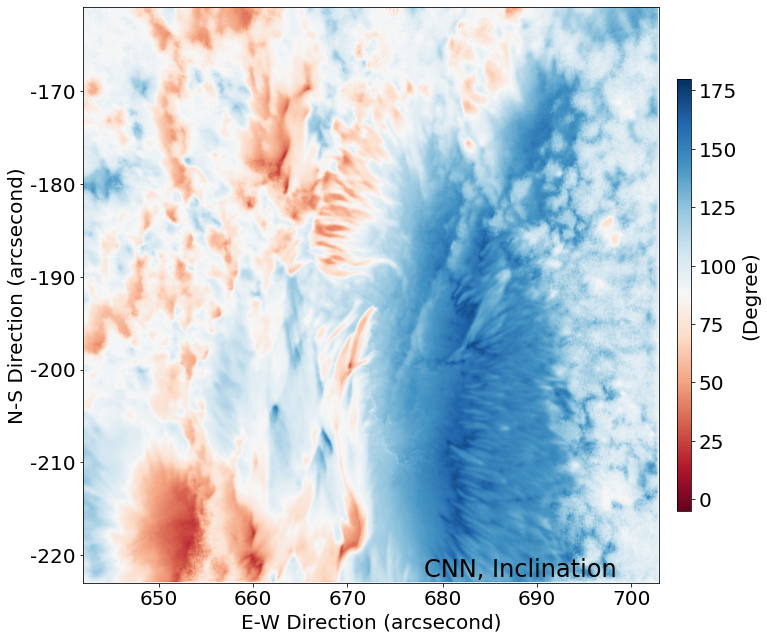

In [43]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(img_width, img_height))
norm = matplotlib.colors.Normalize(vmin=-5, vmax=180)
im = ax.imshow(ref_angle_img, cmap=my_map, norm=norm)
ax.imshow(predicted_inclination_img, cmap=my_map, norm=norm)
ax.set_ylabel('N-S Direction (arcsecond)', fontsize=fontsize)
ax.set_xlabel('E-W Direction (arcsecond)', fontsize=fontsize)
ax.set_xticks([94, 212, 330, 449, 567, 685])
ax.set_xticklabels(['650', '660', '670', '680', '690', '700'], fontsize=fontsize)
ax.set_yticks([105, 221, 337, 453, 569, 685])
ax.set_yticklabels(['-170', '-180', '-190', '-200', '-210', '-220'], fontsize=fontsize)
ax.set_title('CNN, Inclination', x=0.76, y=0, fontsize=titlesize)
fig.subplots_adjust(bottom=0.1, top=0.9, left=0.1, right=0.9, wspace=0.15, hspace=0.15)
cax = plt.axes([0.925, 0.2, 0.02, 0.6])  # bottom left width height
matplotlib.rcParams.update({'font.size': fontsize})
cb = fig.colorbar(im, cax=cax, norm=norm)
cb.ax.tick_params(labelsize=fontsize)
cb.set_label('(Degree)', fontsize=fontsize)
plt.savefig('./results/testset_1/images/inclination.png', bbox_inches='tight')

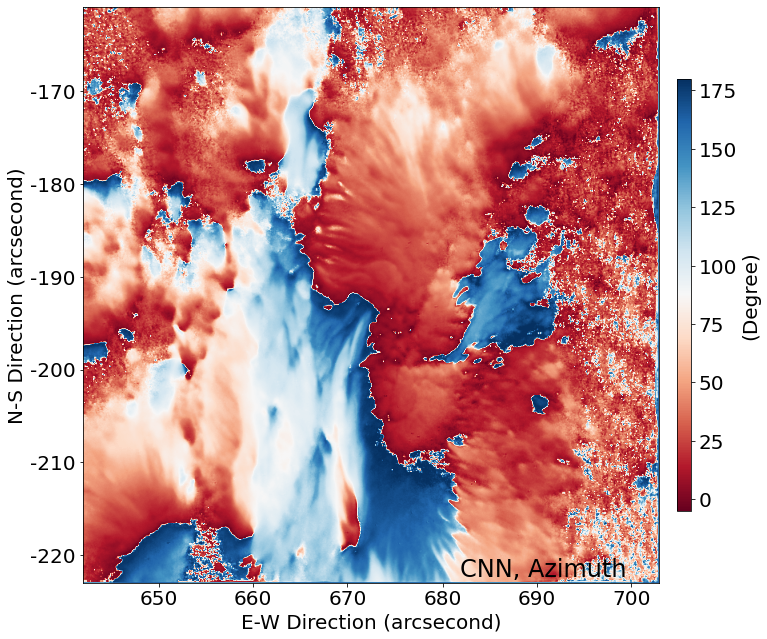

In [44]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(img_width, img_height))
norm = matplotlib.colors.Normalize(vmin=-5, vmax=180)
im = ax.imshow(ref_angle_img, cmap=my_map, norm=norm)
ax.imshow(predicted_azimuth_img, cmap=my_map, norm=norm)
ax.set_ylabel('N-S Direction (arcsecond)', fontsize=fontsize)
ax.set_xlabel('E-W Direction (arcsecond)', fontsize=fontsize)
ax.set_xticks([94, 212, 330, 449, 567, 685])
ax.set_xticklabels(['650', '660', '670', '680', '690', '700'], fontsize=fontsize)
ax.set_yticks([105, 221, 337, 453, 569, 685])
ax.set_yticklabels(['-170', '-180', '-190', '-200', '-210', '-220'], fontsize=fontsize)
ax.set_title('CNN, Azimuth', x=0.8, y=0, fontsize=titlesize)
fig.subplots_adjust(bottom=0.1, top=0.9, left=0.1, right=0.9, wspace=0.15, hspace=0.15)
cax = plt.axes([0.925, 0.2, 0.02, 0.6])  # bottom left width height
matplotlib.rcParams.update({'font.size': fontsize})
cb = fig.colorbar(im, cax=cax, norm=norm)
cb.ax.tick_params(labelsize=fontsize)
cb.set_label('(Degree)', fontsize=fontsize)
plt.savefig('./results/testset_1/images/azimuth.png', bbox_inches='tight')

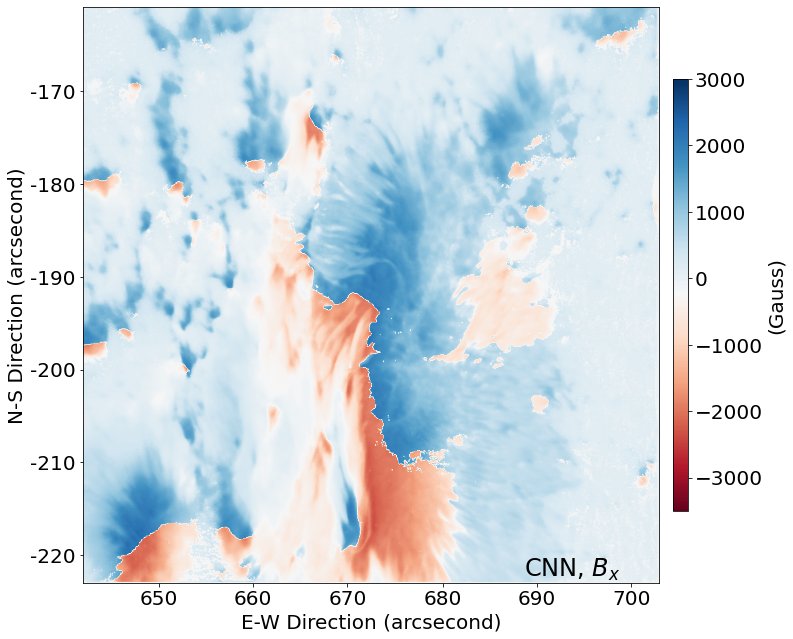

In [45]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(img_width, img_height))
norm = matplotlib.colors.Normalize(vmin=-3500, vmax=3000)
im = ax.imshow(ref_bx_img, cmap=my_map, norm=norm)
ax.imshow(predicted_bx_img, cmap=my_map, norm=norm)
ax.set_ylabel('N-S Direction (arcsecond)', fontsize=fontsize)
ax.set_xlabel('E-W Direction (arcsecond)', fontsize=fontsize)
ax.set_xticks([94, 212, 330, 449, 567, 685])
ax.set_xticklabels(['650', '660', '670', '680', '690', '700'], fontsize=fontsize)
ax.set_yticks([105, 221, 337, 453, 569, 685])
ax.set_yticklabels(['-170', '-180', '-190', '-200', '-210', '-220'], fontsize=fontsize)
ax.set_title('CNN, $B_x$', x=0.85, y=0, fontsize=titlesize)
fig.subplots_adjust(bottom=0.1, top=0.9, left=0.1, right=0.9, wspace=0.15, hspace=0.15)
cax = plt.axes([0.92, 0.2, 0.02, 0.6])  # bottom left width height
matplotlib.rcParams.update({'font.size': fontsize})
cb = fig.colorbar(im, cax=cax, norm=norm)
cb.ax.tick_params(labelsize=fontsize)
cb.set_label('(Gauss)', fontsize=fontsize)
plt.savefig('./results/testset_1/images/Bx.png', bbox_inches='tight')

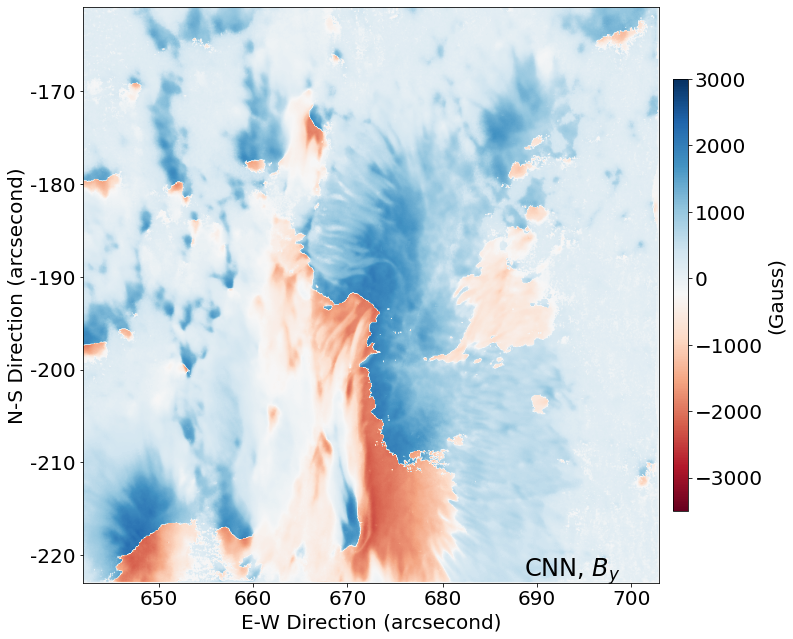

In [46]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(img_width, img_height))
norm = matplotlib.colors.Normalize(vmin=-3500, vmax=3000)
im = ax.imshow(ref_by_img, cmap=my_map, norm=norm)
ax.imshow(predicted_by_img, cmap=my_map, norm=norm)
ax.set_ylabel('N-S Direction (arcsecond)', fontsize=fontsize)
ax.set_xlabel('E-W Direction (arcsecond)', fontsize=fontsize)
ax.set_xticks([94, 212, 330, 449, 567, 685])
ax.set_xticklabels(['650', '660', '670', '680', '690', '700'], fontsize=fontsize)
ax.set_yticks([105, 221, 337, 453, 569, 685])
ax.set_yticklabels(['-170', '-180', '-190', '-200', '-210', '-220'], fontsize=fontsize)
ax.set_title('CNN, $B_y$', x=0.85, y=0, fontsize=titlesize)
fig.subplots_adjust(bottom=0.1, top=0.9, left=0.1, right=0.9, wspace=0.15, hspace=0.15)
cax = plt.axes([0.92, 0.2, 0.02, 0.6])  # bottom left width height
matplotlib.rcParams.update({'font.size': fontsize})
cb = fig.colorbar(im, cax=cax, norm=norm)
cb.ax.tick_params(labelsize=fontsize)
cb.set_label('(Gauss)', fontsize=fontsize)
plt.savefig('./results/testset_1/images/By.png', bbox_inches='tight')

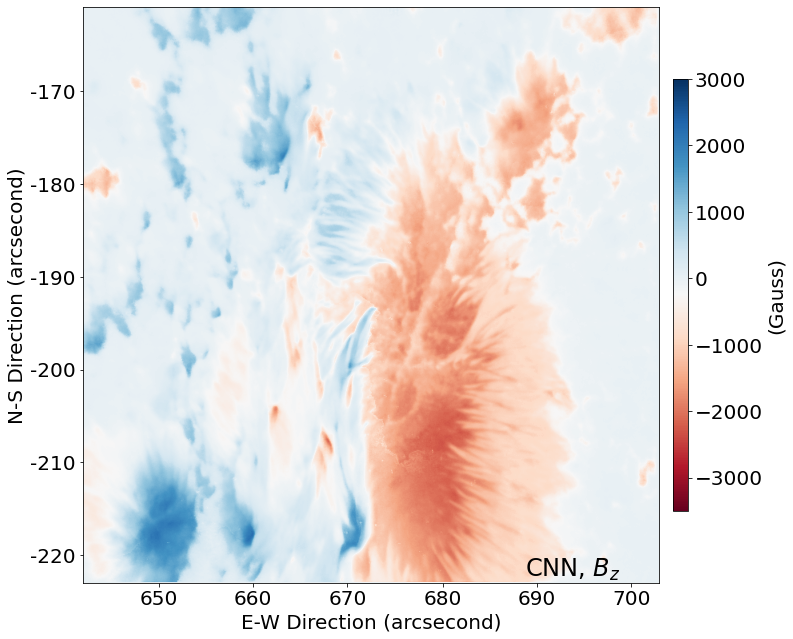

In [47]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(img_width, img_height))
norm = matplotlib.colors.Normalize(vmin=-3500, vmax=3000)
im = ax.imshow(ref_bz_img, cmap=my_map, norm=norm)
ax.imshow(predicted_bz_img, cmap=my_map, norm=norm)
ax.set_ylabel('N-S Direction (arcsecond)', fontsize=fontsize)
ax.set_xlabel('E-W Direction (arcsecond)', fontsize=fontsize)
ax.set_xticks([94, 212, 330, 449, 567, 685])
ax.set_xticklabels(['650', '660', '670', '680', '690', '700'], fontsize=fontsize)
ax.set_yticks([105, 221, 337, 453, 569, 685])
ax.set_yticklabels(['-170', '-180', '-190', '-200', '-210', '-220'], fontsize=fontsize)
ax.set_title('CNN, $B_z$', x=0.85, y=0, fontsize=titlesize)
fig.subplots_adjust(bottom=0.1, top=0.9, left=0.1, right=0.9, wspace=0.15, hspace=0.15)
cax = plt.axes([0.92, 0.2, 0.02, 0.6])  # bottom left width height
matplotlib.rcParams.update({'font.size': fontsize})
cb = fig.colorbar(im, cax=cax, norm=norm)
cb.ax.tick_params(labelsize=fontsize)
cb.set_label('(Gauss)', fontsize=fontsize)
plt.savefig('./results/testset_1/images/Bz.png', bbox_inches='tight')

### Test Set 2

In [29]:
df = pd.read_csv('./Data/Testing/testset2/normalized_testset2.csv', header=None)
df_values = df.values
X_data = df_values
X = X_data.reshape(X_data.shape[0], 60, 3)

In [30]:
start = time.time()
y_predict = model.predict(X)
end = time.time()
print('Time:', np.round(end - start, 1), 's')

Time: 18.4 s


In [31]:
result_file = './Results/testset_2/testset2.csv'
with open(result_file, 'w', encoding='UTF-8') as result_csv:
    w = csv.writer(result_csv)
    for i in range(len(y_predict)):
        tmp = list()
        tmp.append(y_predict[i][0])
        tmp.append(y_predict[i][1])
        tmp.append(y_predict[i][2])
        w.writerow(tmp)

In [48]:
test_two = './Results/testset_2/testset2.csv'
df = pd.read_csv(test_two, header=None)

In [50]:
df_value = df.values

In [51]:
df_value[:, [0]] = df_value[:, [0]] * 5000.
df_value[:, [1, 2]] = df_value[:, [1,2]] * math.pi
predicted_bx = np.multiply(np.multiply(df_value[:, 0], np.sin(df_value[:, 1])), np.cos(df_value[:, 2]))
predicted_by = np.multiply(np.multiply(df_value[:, 0], np.sin(df_value[:, 1])), np.cos(df_value[:, 2]))
predicted_bz = np.multiply(df_value[:, 0], np.cos(df_value[:, 1]))
df_value[:, [1, 2]] = df_value[:, [1, 2]] / math.pi * 180.
predicted_btotal_img = df_value[:, 0].reshape(720, 720)
predicted_inclination_img = df_value[:, 1].reshape(720, 720)
predicted_azimuth_img = df_value[:, 2].reshape(720, 720)
predicted_bx_img = predicted_bx.reshape(720, 720)
predicted_by_img = predicted_by.reshape(720, 720)
predicted_bz_img = predicted_bz.reshape(720, 720)
ref_btotal_img = np.ones((720, 720)) * 4000
ref_btotal_img[0][0] = 0
ref_angle_img = np.ones((720, 720)) * 180
ref_angle_img[0][0] = -5
ref_bx_img = np.ones((720, 720)) * 3000
ref_bx_img[0][0] = -3500
ref_by_img = np.ones((720, 720)) * 3000
ref_by_img[0][0] = -3500
ref_bz_img = np.ones((720, 720)) * 3000
ref_bz_img[0][0] = -3500
ref_bz_img = np.ones((720, 720)) * 3000
ref_bz_img[0][0] = -3500

In [52]:
my_map = 'RdBu'
img_width = 10
img_height = 10

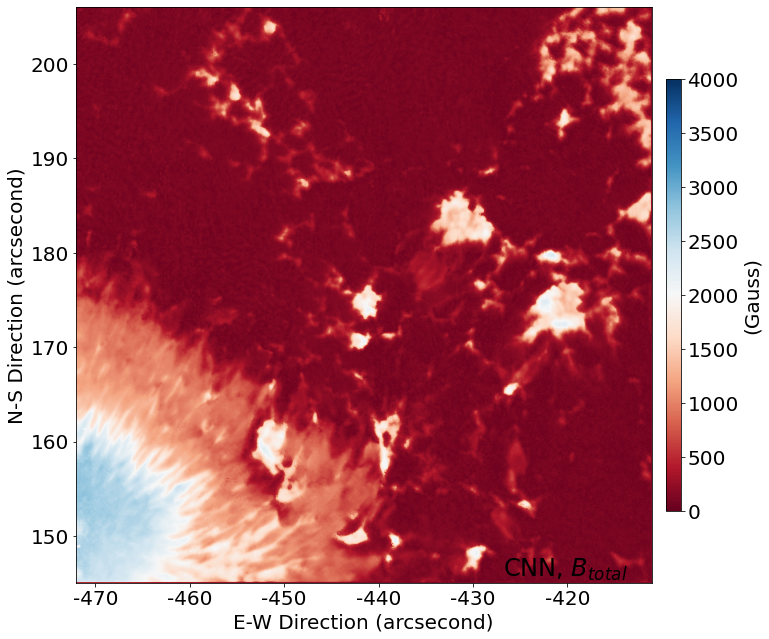

In [53]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(img_width, img_height))
norm = matplotlib.colors.Normalize(vmin=0, vmax=4000)
im = ax.imshow(ref_btotal_img, cmap=my_map, norm=norm)
ax.imshow(predicted_btotal_img, cmap=my_map, norm=norm)
ax.set_ylabel('N-S Direction (arcsecond)', fontsize=fontsize)
ax.set_xlabel('E-W Direction (arcsecond)', fontsize=fontsize)
ax.set_xticks([24, 142, 260, 378, 496, 614])
ax.set_xticklabels(['-470', '-460', '-450', '-440', '-430', '-420'], fontsize=fontsize)
ax.set_yticks([71, 189, 307, 425, 543, 661])
ax.set_yticklabels(['200', '190', '180', '170', '160', '150'], fontsize=fontsize)
ax.set_title('CNN, $B_{total}$', x=0.85, y=0, fontsize=titlesize)
fig.subplots_adjust(bottom=0.1, top=0.9, left=0.1, right=0.9, wspace=0.15, hspace=0.15)
cax = plt.axes([0.92, 0.2, 0.02, 0.6])  # bottom left width height
matplotlib.rcParams.update({'font.size': fontsize})
cb = fig.colorbar(im, cax=cax, norm=norm)
cb.ax.tick_params(labelsize=fontsize)
cb.set_label('(Gauss)', fontsize=fontsize)
plt.savefig('./results/testset_2/images/Btotal.png', bbox_inches='tight')

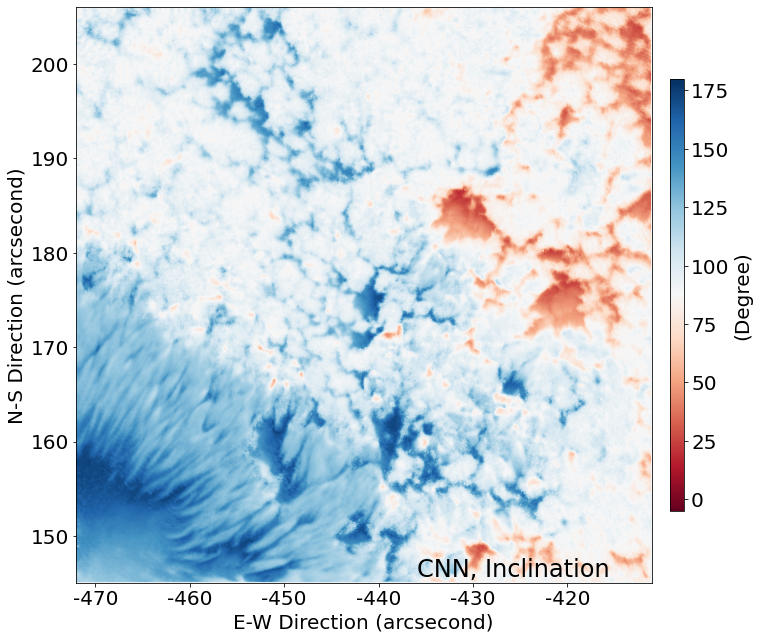

In [54]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(img_width, img_height))
norm = matplotlib.colors.Normalize(vmin=-5, vmax=180)
im = ax.imshow(ref_angle_img, cmap=my_map, norm=norm)
ax.imshow(predicted_inclination_img, cmap=my_map, norm=norm)
ax.set_ylabel('N-S Direction (arcsecond)', fontsize=fontsize)
ax.set_xlabel('E-W Direction (arcsecond)', fontsize=fontsize)
ax.set_xticks([24, 142, 260, 378, 496, 614])
ax.set_xticklabels(['-470', '-460', '-450', '-440', '-430', '-420'], fontsize=fontsize)
ax.set_yticks([71, 189, 307, 425, 543, 661])
ax.set_yticklabels(['200', '190', '180', '170', '160', '150'], fontsize=fontsize)
ax.set_title('CNN, Inclination', x=0.76, y=0, fontsize=titlesize)
fig.subplots_adjust(bottom=0.1, top=0.9, left=0.1, right=0.9, wspace=0.15, hspace=0.15)
cax = plt.axes([0.925, 0.2, 0.02, 0.6])  # bottom left width height
matplotlib.rcParams.update({'font.size': fontsize})
cb = fig.colorbar(im, cax=cax, norm=norm)
cb.ax.tick_params(labelsize=fontsize)
cb.set_label('(Degree)', fontsize=fontsize)
plt.savefig('./results/testset_2/images/inclination.png', bbox_inches='tight')

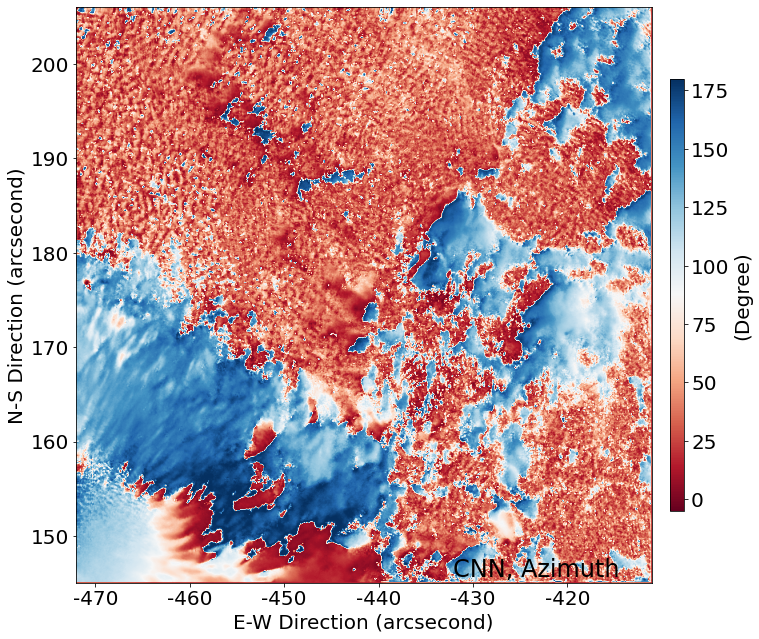

In [55]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(img_width, img_height))
norm = matplotlib.colors.Normalize(vmin=-5, vmax=180)
im = ax.imshow(ref_angle_img, cmap=my_map, norm=norm)
ax.imshow(predicted_azimuth_img, cmap=my_map, norm=norm)
ax.set_ylabel('N-S Direction (arcsecond)', fontsize=fontsize)
ax.set_xlabel('E-W Direction (arcsecond)', fontsize=fontsize)
ax.set_xticks([24, 142, 260, 378, 496, 614])
ax.set_xticklabels(['-470', '-460', '-450', '-440', '-430', '-420'], fontsize=fontsize)
ax.set_yticks([71, 189, 307, 425, 543, 661])
ax.set_yticklabels(['200', '190', '180', '170', '160', '150'], fontsize=fontsize)
ax.set_title('CNN, Azimuth', x=0.8, y=0, fontsize=titlesize)
fig.subplots_adjust(bottom=0.1, top=0.9, left=0.1, right=0.9, wspace=0.15, hspace=0.15)
cax = plt.axes([0.925, 0.2, 0.02, 0.6])  # bottom left width height
matplotlib.rcParams.update({'font.size': fontsize})
cb = fig.colorbar(im, cax=cax, norm=norm)
cb.ax.tick_params(labelsize=fontsize)
cb.set_label('(Degree)', fontsize=fontsize)
plt.savefig('./results/testset_2/images/azimuth.png', bbox_inches='tight')

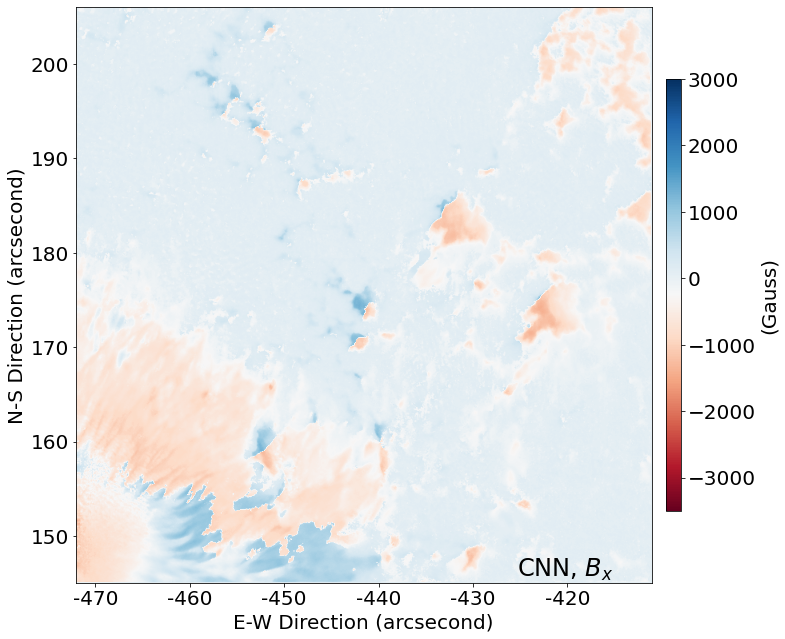

In [56]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(img_width, img_height))
norm = matplotlib.colors.Normalize(vmin=-3500, vmax=3000)
im = ax.imshow(ref_bx_img, cmap=my_map, norm=norm)
ax.imshow(predicted_bx_img, cmap=my_map, norm=norm)
ax.set_ylabel('N-S Direction (arcsecond)', fontsize=fontsize)
ax.set_xlabel('E-W Direction (arcsecond)', fontsize=fontsize)
ax.set_xticks([24, 142, 260, 378, 496, 614])
ax.set_xticklabels(['-470', '-460', '-450', '-440', '-430', '-420'], fontsize=fontsize)
ax.set_yticks([71, 189, 307, 425, 543, 661])
ax.set_yticklabels(['200', '190', '180', '170', '160', '150'], fontsize=fontsize)
ax.set_title('CNN, $B_x$', x=0.85, y=0, fontsize=titlesize)
fig.subplots_adjust(bottom=0.1, top=0.9, left=0.1, right=0.9, wspace=0.15, hspace=0.15)
cax = plt.axes([0.92, 0.2, 0.02, 0.6])  # bottom left width height
matplotlib.rcParams.update({'font.size': fontsize})
cb = fig.colorbar(im, cax=cax, norm=norm)
cb.ax.tick_params(labelsize=fontsize)
cb.set_label('(Gauss)', fontsize=fontsize)
plt.savefig('./results/testset_2/images/Bx.png', bbox_inches='tight')

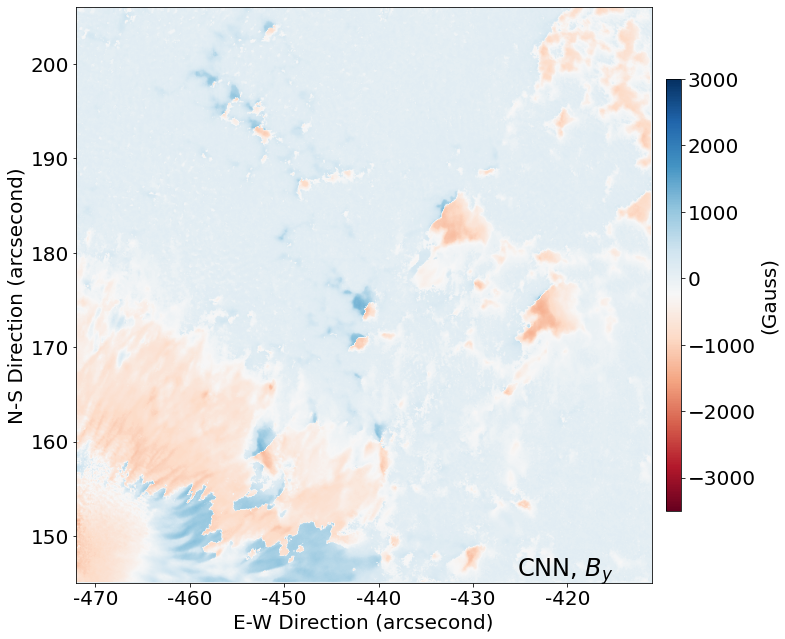

In [57]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(img_width, img_height))
norm = matplotlib.colors.Normalize(vmin=-3500, vmax=3000)
im = ax.imshow(ref_by_img, cmap=my_map, norm=norm)
ax.imshow(predicted_by_img, cmap=my_map, norm=norm)
ax.set_ylabel('N-S Direction (arcsecond)', fontsize=fontsize)
ax.set_xlabel('E-W Direction (arcsecond)', fontsize=fontsize)
ax.set_xticks([24, 142, 260, 378, 496, 614])
ax.set_xticklabels(['-470', '-460', '-450', '-440', '-430', '-420'], fontsize=fontsize)
ax.set_yticks([71, 189, 307, 425, 543, 661])
ax.set_yticklabels(['200', '190', '180', '170', '160', '150'], fontsize=fontsize)
ax.set_title('CNN, $B_y$', x=0.85, y=0, fontsize=titlesize)
fig.subplots_adjust(bottom=0.1, top=0.9, left=0.1, right=0.9, wspace=0.15, hspace=0.15)
cax = plt.axes([0.92, 0.2, 0.02, 0.6])  # bottom left width height
matplotlib.rcParams.update({'font.size': fontsize})
cb = fig.colorbar(im, cax=cax, norm=norm)
cb.ax.tick_params(labelsize=fontsize)
cb.set_label('(Gauss)', fontsize=fontsize)
plt.savefig('./results/testset_2/images/By.png', bbox_inches='tight')

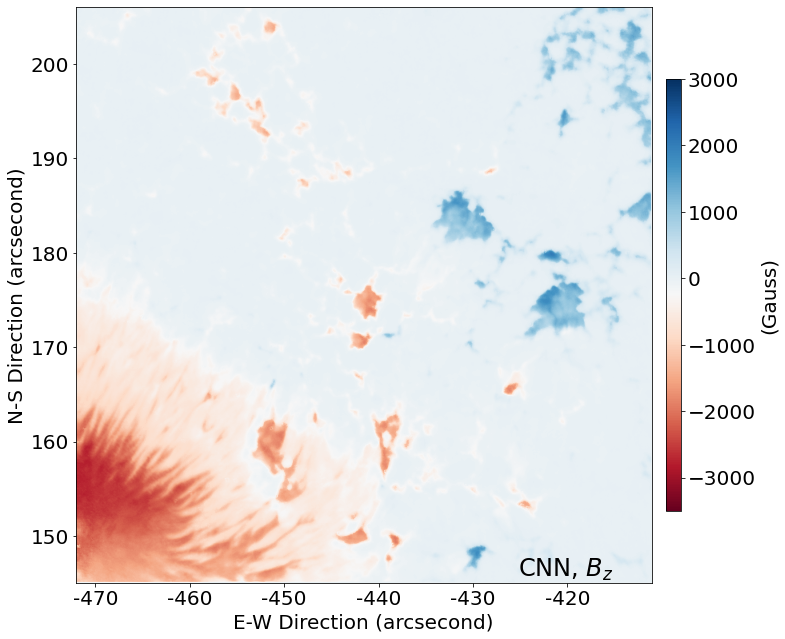

In [58]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(img_width, img_height))
norm = matplotlib.colors.Normalize(vmin=-3500, vmax=3000)
im = ax.imshow(ref_bz_img, cmap=my_map, norm=norm)
ax.imshow(predicted_bz_img, cmap=my_map, norm=norm)
ax.set_ylabel('N-S Direction (arcsecond)', fontsize=fontsize)
ax.set_xlabel('E-W Direction (arcsecond)', fontsize=fontsize)
ax.set_xticks([24, 142, 260, 378, 496, 614])
ax.set_xticklabels(['-470', '-460', '-450', '-440', '-430', '-420'], fontsize=fontsize)
ax.set_yticks([71, 189, 307, 425, 543, 661])
ax.set_yticklabels(['200', '190', '180', '170', '160', '150'], fontsize=fontsize)
ax.set_title('CNN, $B_z$', x=0.85, y=0, fontsize=titlesize)
fig.subplots_adjust(bottom=0.1, top=0.9, left=0.1, right=0.9, wspace=0.15, hspace=0.15)
cax = plt.axes([0.92, 0.2, 0.02, 0.6])  # bottom left width height
matplotlib.rcParams.update({'font.size': fontsize})
cb = fig.colorbar(im, cax=cax, norm=norm)
cb.ax.tick_params(labelsize=fontsize)
cb.set_label('(Gauss)', fontsize=fontsize)
plt.savefig('./results/testset_2/images/Bz.png', bbox_inches='tight')

### Test Set 3

In [32]:
df = pd.read_csv('./Data/Testing/testset3/normalized_testset3.csv', header=None)
df_values = df.values
X_data = df_values
X = X_data.reshape(X_data.shape[0], 60, 3)

In [33]:
start = time.time()
y_predict = model.predict(X)
end = time.time()
print('Time:', np.round(end - start, 1), 's')

Time: 18.4 s


In [34]:
result_file = './Results/testset_3/testset3.csv'
with open(result_file, 'w', encoding='UTF-8') as result_csv:
    w = csv.writer(result_csv)
    for i in range(len(y_predict)):
        tmp = list()
        tmp.append(y_predict[i][0])
        tmp.append(y_predict[i][1])
        tmp.append(y_predict[i][2])
        w.writerow(tmp)

In [59]:
test_three = './Results/testset_3/testset3.csv'
df = pd.read_csv(test_three, header=None)

In [60]:
df_value = df.values
df_value[:, [0]] = df_value[:, [0]] * 5000.
df_value[:, [1, 2]] = df_value[:, [1,2]] * math.pi
predicted_bx = np.multiply(np.multiply(df_value[:, 0], np.sin(df_value[:, 1])), np.cos(df_value[:, 2]))
predicted_by = np.multiply(np.multiply(df_value[:, 0], np.sin(df_value[:, 1])), np.cos(df_value[:, 2]))
predicted_bz = np.multiply(df_value[:, 0], np.cos(df_value[:, 1]))
df_value[:, [1, 2]] = df_value[:, [1, 2]] / math.pi * 180.
predicted_btotal_img = df_value[:, 0].reshape(720, 720)
predicted_inclination_img = df_value[:, 1].reshape(720, 720)
predicted_azimuth_img = df_value[:, 2].reshape(720, 720)
predicted_bx_img = predicted_bx.reshape(720, 720)
predicted_by_img = predicted_by.reshape(720, 720)
predicted_bz_img = predicted_bz.reshape(720, 720)
ref_btotal_img = np.ones((720, 720)) * 4000
ref_btotal_img[0][0] = 0
ref_angle_img = np.ones((720, 720)) * 180
ref_angle_img[0][0] = -5
ref_bx_img = np.ones((720, 720)) * 3000
ref_bx_img[0][0] = -3500
ref_by_img = np.ones((720, 720)) * 3000
ref_by_img[0][0] = -3500
ref_bz_img = np.ones((720, 720)) * 3000
ref_bz_img[0][0] = -3500
ref_bz_img = np.ones((720, 720)) * 3000
ref_bz_img[0][0] = -3500

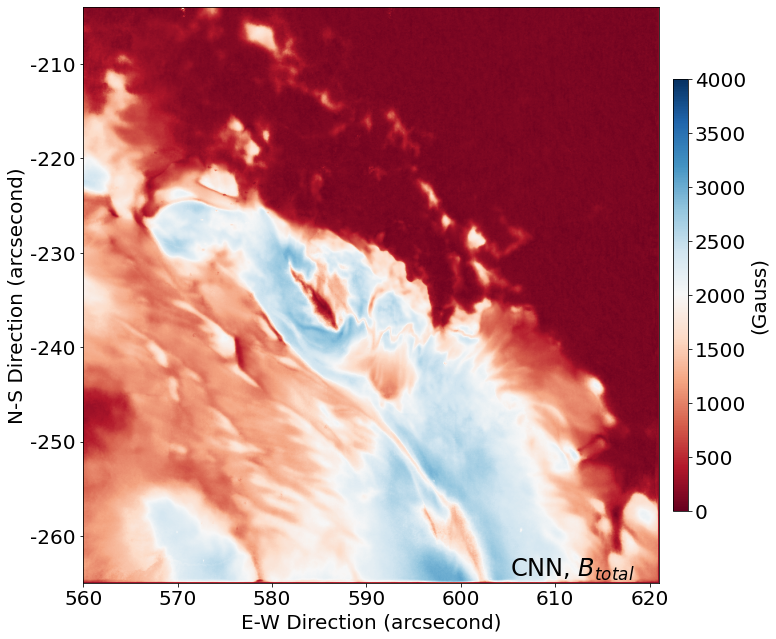

In [62]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(img_width, img_height))
norm = matplotlib.colors.Normalize(vmin=0, vmax=4000)
im = ax.imshow(ref_btotal_img, cmap=my_map, norm=norm)
ax.imshow(predicted_btotal_img, cmap=my_map, norm=norm)
ax.set_ylabel('N-S Direction (arcsecond)', fontsize=fontsize)
ax.set_xlabel('E-W Direction (arcsecond)', fontsize=fontsize)
ax.set_xticks([0, 118, 236, 354, 472, 590, 708])
ax.set_xticklabels(['560', '570', '580', '590', '600', '610', '620'], fontsize=fontsize)
ax.set_yticks([71, 189, 307, 425, 543, 661])
ax.set_yticklabels(['-210', '-220', '-230', '-240', '-250', '-260'], fontsize=fontsize)
ax.set_title('CNN, $B_{total}$', x=0.85, y=0, fontsize=titlesize)
fig.subplots_adjust(bottom=0.1, top=0.9, left=0.1, right=0.9, wspace=0.15, hspace=0.15)
cax = plt.axes([0.92, 0.2, 0.02, 0.6])  # bottom left width height
matplotlib.rcParams.update({'font.size': fontsize})
cb = fig.colorbar(im, cax=cax, norm=norm)
cb.ax.tick_params(labelsize=fontsize)
cb.set_label('(Gauss)', fontsize=fontsize)
plt.savefig('./results/testset_3/images/Btotal.png', bbox_inches='tight')

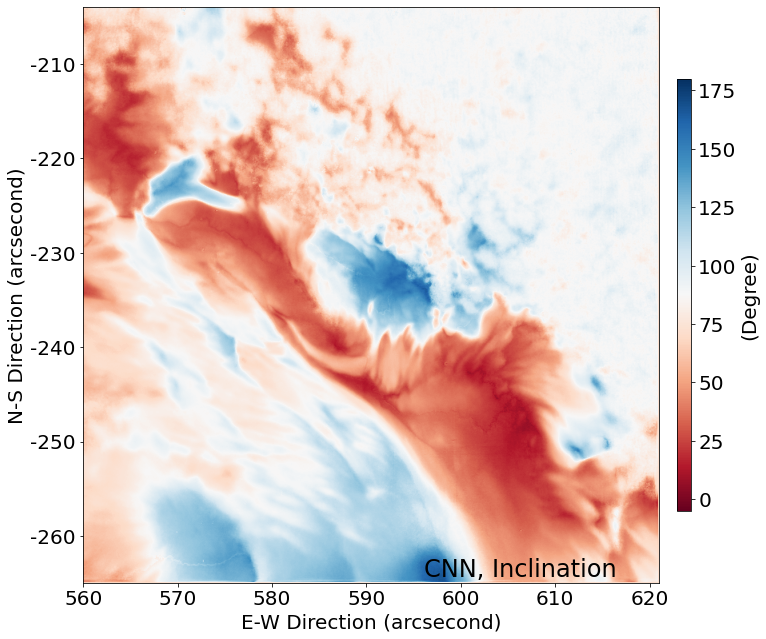

In [63]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(img_width, img_height))
norm = matplotlib.colors.Normalize(vmin=-5, vmax=180)
im = ax.imshow(ref_angle_img, cmap=my_map, norm=norm)
ax.imshow(predicted_inclination_img, cmap=my_map, norm=norm)
ax.set_ylabel('N-S Direction (arcsecond)', fontsize=fontsize)
ax.set_xlabel('E-W Direction (arcsecond)', fontsize=fontsize)
ax.set_xticks([0, 118, 236, 354, 472, 590, 708])
ax.set_xticklabels(['560', '570', '580', '590', '600', '610', '620'], fontsize=fontsize)
ax.set_yticks([71, 189, 307, 425, 543, 661])
ax.set_yticklabels(['-210', '-220', '-230', '-240', '-250', '-260'], fontsize=fontsize)
ax.set_title('CNN, Inclination', x=0.76, y=0, fontsize=titlesize)
fig.subplots_adjust(bottom=0.1, top=0.9, left=0.1, right=0.9, wspace=0.15, hspace=0.15)
cax = plt.axes([0.925, 0.2, 0.02, 0.6])  # bottom left width height
matplotlib.rcParams.update({'font.size': fontsize})
cb = fig.colorbar(im, cax=cax, norm=norm)
cb.ax.tick_params(labelsize=fontsize)
cb.set_label('(Degree)', fontsize=fontsize)
plt.savefig('./results/testset_3/images/inclination.png', bbox_inches='tight')

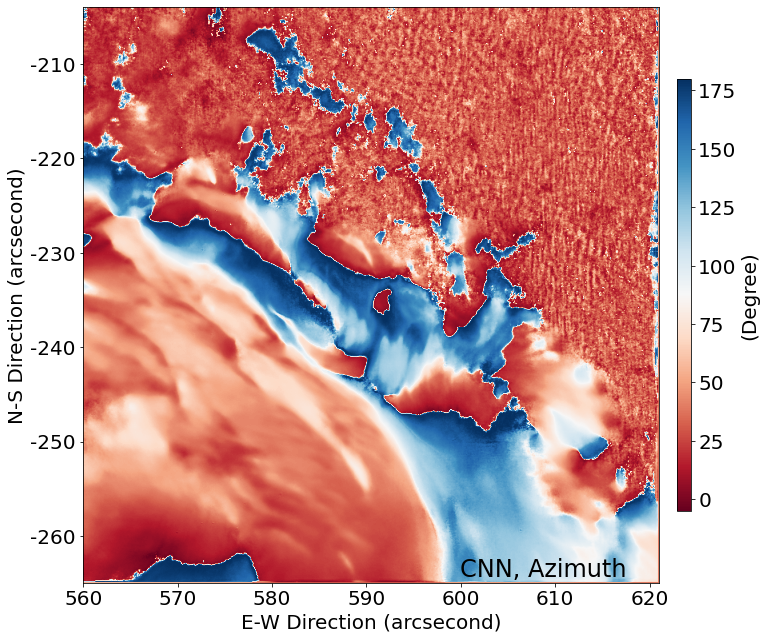

In [64]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(img_width, img_height))
norm = matplotlib.colors.Normalize(vmin=-5, vmax=180)
im = ax.imshow(ref_angle_img, cmap=my_map, norm=norm)
ax.imshow(predicted_azimuth_img, cmap=my_map, norm=norm)
ax.set_ylabel('N-S Direction (arcsecond)', fontsize=fontsize)
ax.set_xlabel('E-W Direction (arcsecond)', fontsize=fontsize)
ax.set_xticks([0, 118, 236, 354, 472, 590, 708])
ax.set_xticklabels(['560', '570', '580', '590', '600', '610', '620'], fontsize=fontsize)
ax.set_yticks([71, 189, 307, 425, 543, 661])
ax.set_yticklabels(['-210', '-220', '-230', '-240', '-250', '-260'], fontsize=fontsize)
ax.set_title('CNN, Azimuth', x=0.8, y=0, fontsize=titlesize)
fig.subplots_adjust(bottom=0.1, top=0.9, left=0.1, right=0.9, wspace=0.15, hspace=0.15)
cax = plt.axes([0.925, 0.2, 0.02, 0.6])  # bottom left width height
matplotlib.rcParams.update({'font.size': fontsize})
cb = fig.colorbar(im, cax=cax, norm=norm)
cb.ax.tick_params(labelsize=fontsize)
cb.set_label('(Degree)', fontsize=fontsize)
plt.savefig('./results/testset_3/images/azimuth.png', bbox_inches='tight')

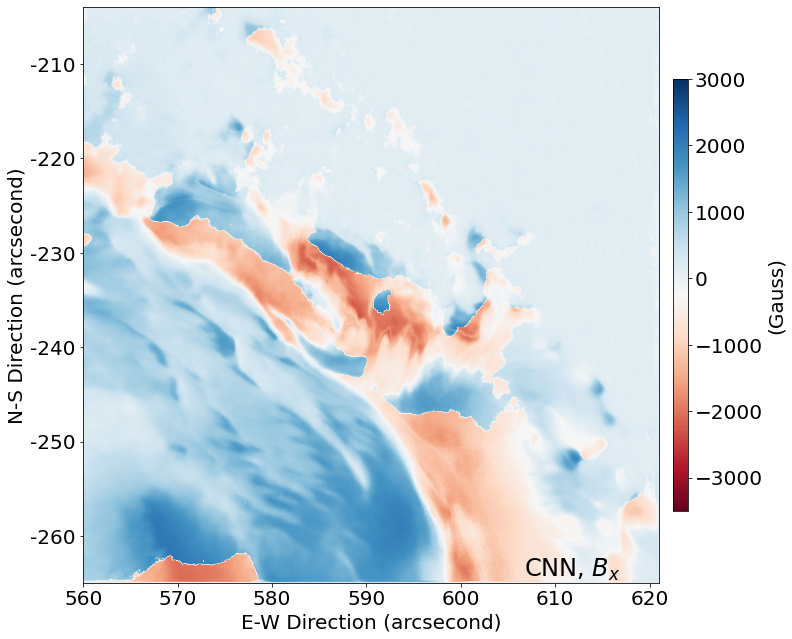

In [65]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(img_width, img_height))
norm = matplotlib.colors.Normalize(vmin=-3500, vmax=3000)
im = ax.imshow(ref_bx_img, cmap=my_map, norm=norm)
ax.imshow(predicted_bx_img, cmap=my_map, norm=norm)
ax.set_ylabel('N-S Direction (arcsecond)', fontsize=fontsize)
ax.set_xlabel('E-W Direction (arcsecond)', fontsize=fontsize)
ax.set_xticks([0, 118, 236, 354, 472, 590, 708])
ax.set_xticklabels(['560', '570', '580', '590', '600', '610', '620'], fontsize=fontsize)
ax.set_yticks([71, 189, 307, 425, 543, 661])
ax.set_yticklabels(['-210', '-220', '-230', '-240', '-250', '-260'], fontsize=fontsize)
ax.set_title('CNN, $B_x$', x=0.85, y=0, fontsize=titlesize)
fig.subplots_adjust(bottom=0.1, top=0.9, left=0.1, right=0.9, wspace=0.15, hspace=0.15)
cax = plt.axes([0.92, 0.2, 0.02, 0.6])  # bottom left width height
matplotlib.rcParams.update({'font.size': fontsize})
cb = fig.colorbar(im, cax=cax, norm=norm)
cb.ax.tick_params(labelsize=fontsize)
cb.set_label('(Gauss)', fontsize=fontsize)
plt.savefig('./results/testset_3/images/Bx.png', bbox_inches='tight')

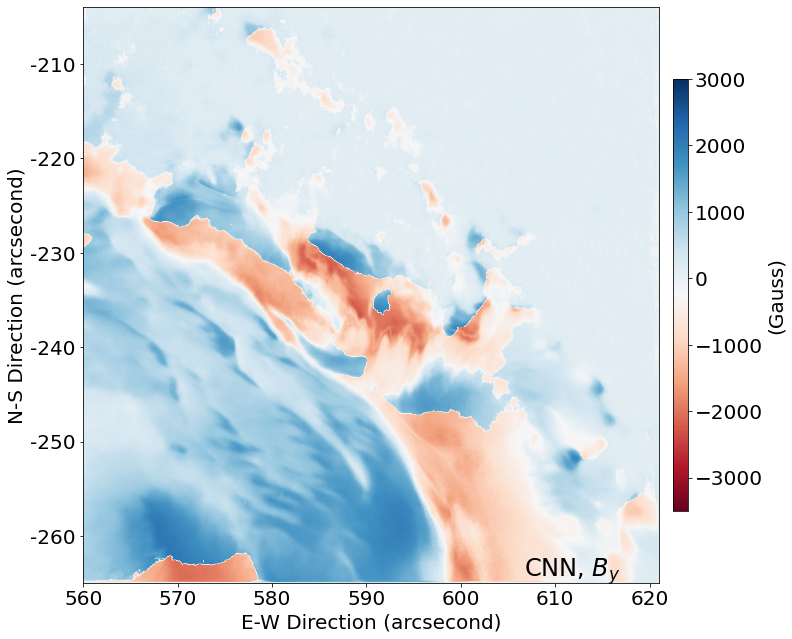

In [66]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(img_width, img_height))
norm = matplotlib.colors.Normalize(vmin=-3500, vmax=3000)
im = ax.imshow(ref_by_img, cmap=my_map, norm=norm)
ax.imshow(predicted_by_img, cmap=my_map, norm=norm)
ax.set_ylabel('N-S Direction (arcsecond)', fontsize=fontsize)
ax.set_xlabel('E-W Direction (arcsecond)', fontsize=fontsize)
ax.set_xticks([0, 118, 236, 354, 472, 590, 708])
ax.set_xticklabels(['560', '570', '580', '590', '600', '610', '620'], fontsize=fontsize)
ax.set_yticks([71, 189, 307, 425, 543, 661])
ax.set_yticklabels(['-210', '-220', '-230', '-240', '-250', '-260'], fontsize=fontsize)
ax.set_title('CNN, $B_y$', x=0.85, y=0, fontsize=titlesize)
fig.subplots_adjust(bottom=0.1, top=0.9, left=0.1, right=0.9, wspace=0.15, hspace=0.15)
cax = plt.axes([0.92, 0.2, 0.02, 0.6])  # bottom left width height
matplotlib.rcParams.update({'font.size': fontsize})
cb = fig.colorbar(im, cax=cax, norm=norm)
cb.ax.tick_params(labelsize=fontsize)
cb.set_label('(Gauss)', fontsize=fontsize)
plt.savefig('./results/testset_3/images/By.png', bbox_inches='tight')

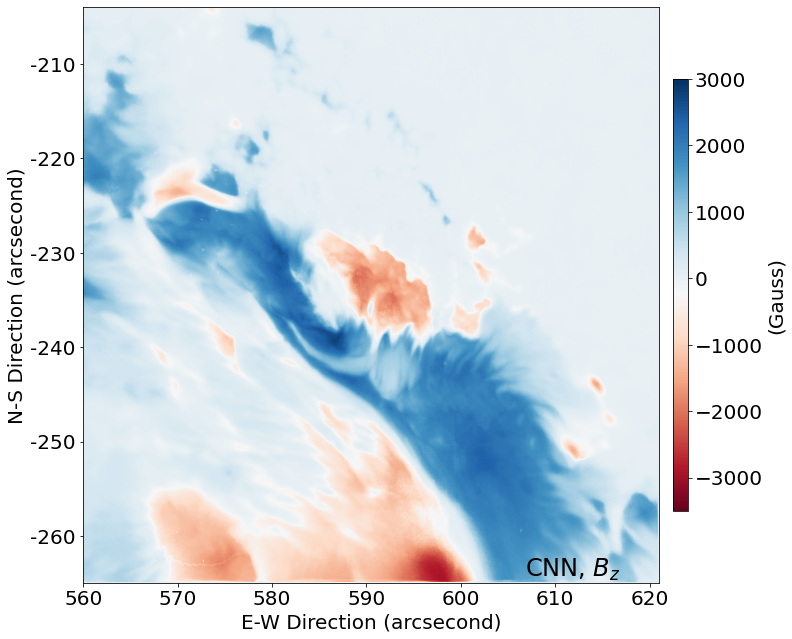

In [67]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(img_width, img_height))
norm = matplotlib.colors.Normalize(vmin=-3500, vmax=3000)
im = ax.imshow(ref_bz_img, cmap=my_map, norm=norm)
ax.imshow(predicted_bz_img, cmap=my_map, norm=norm)
ax.set_ylabel('N-S Direction (arcsecond)', fontsize=fontsize)
ax.set_xlabel('E-W Direction (arcsecond)', fontsize=fontsize)
ax.set_xticks([0, 118, 236, 354, 472, 590, 708])
ax.set_xticklabels(['560', '570', '580', '590', '600', '610', '620'], fontsize=fontsize)
ax.set_yticks([71, 189, 307, 425, 543, 661])
ax.set_yticklabels(['-210', '-220', '-230', '-240', '-250', '-260'], fontsize=fontsize)
ax.set_title('CNN, $B_z$', x=0.85, y=0, fontsize=titlesize)
fig.subplots_adjust(bottom=0.1, top=0.9, left=0.1, right=0.9, wspace=0.15, hspace=0.15)
cax = plt.axes([0.92, 0.2, 0.02, 0.6])  # bottom left width height
matplotlib.rcParams.update({'font.size': fontsize})
cb = fig.colorbar(im, cax=cax, norm=norm)
cb.ax.tick_params(labelsize=fontsize)
cb.set_label('(Gauss)', fontsize=fontsize)
plt.savefig('./results/testset_3/images/Bz.png', bbox_inches='tight')